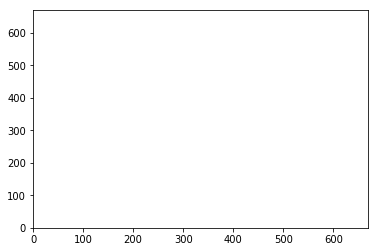

In [3]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import matplotlib.animation

import PIL
from PIL import Image

from IPython.display import HTML

# Get img as an array
img = PIL.Image.open("linia_2.png").convert("L")
line_array = np.array(img)

# Get img as an 2d-table
line_matrix = pd.DataFrame([(x<100) for x in line_array])
ylen, xlen = line_matrix.shape

# Get 2 separate lists: of x and y coordinates
xs, ys = [], []
for x in range(xlen):
    y = ylen
    for pixel in line_matrix[x]:
        if pixel is True:
            xs.append(x)
            ys.append(y)
        y -=1

# Display as a plot
fig, ax = plt.subplots()

ax.axis([0, xlen, 0, xlen]) # Show plot starting from (0,0)
l, = ax.plot([],[])

def animate(i):
    l.set_data(xs[:i], ys[:i])
    
# Animate plot
ani = matplotlib.animation.FuncAnimation(fig, animate, frames=len(xs), interval=1)
HTML(ani.to_jshtml())

# # Save plot as GIF
# !brew install imagemagick # Jupyter import for saving GIF
# ani.save('line_animation.gif', writer='imagemagick', fps=60)